In [1]:
import random

import torch
from torch import nn
from torchvision import datasets
import torchvision.transforms as transforms
import pandas as pd
from torch.utils.data import DataLoader
from torch.optim import Adam, SGD
import numpy as np
import matplotlib as mpl
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torcheval.metrics import FrechetInceptionDistance

from acgan_models import NetD, NetG

In [2]:
if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'
display(f'Device {device} is available.')

manual_seed = 999
torch.manual_seed(manual_seed)
random.seed(manual_seed)
#torch.use_deterministic_algorithms(True)

'Device cuda is available.'

In [3]:
dc_gen = NetG().to(device)
dc_dis = NetD().to(device)

batch_size = 128
#lr = 0.0002
lr = 0.0002
epochs = 50
loss_fn = nn.BCELoss()
class_loss_fn = nn.NLLLoss()
fixed_noise = torch.randn((64, 100, 1,1), device=device)
fixed_labels = torch.randint(0,10, (64,1)).to(device)
# Other normalization factors are located here:  https://github.com/kuangliu/pytorch-cifar/issues/19
transform = transforms.Compose([transforms.Resize(64), transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_loader = DataLoader(datasets.CIFAR10(root='./hw4data', train=True, transform=transform, download=True), batch_size=batch_size,shuffle=True)
test_loader =  DataLoader(datasets.CIFAR10(root='./hw4data', train=False, transform=transform, download=True), batch_size=batch_size,shuffle=True)

gen_optimizer = Adam(dc_gen.parameters(), lr=lr, betas=(.5, .999))
dis_optimizer = Adam(dc_dis.parameters(), lr=lr, betas=(.5, .999))
#dis_optimizer = SGD(dc_dis.parameters(), lr=lr) 

Files already downloaded and verified
Files already downloaded and verified


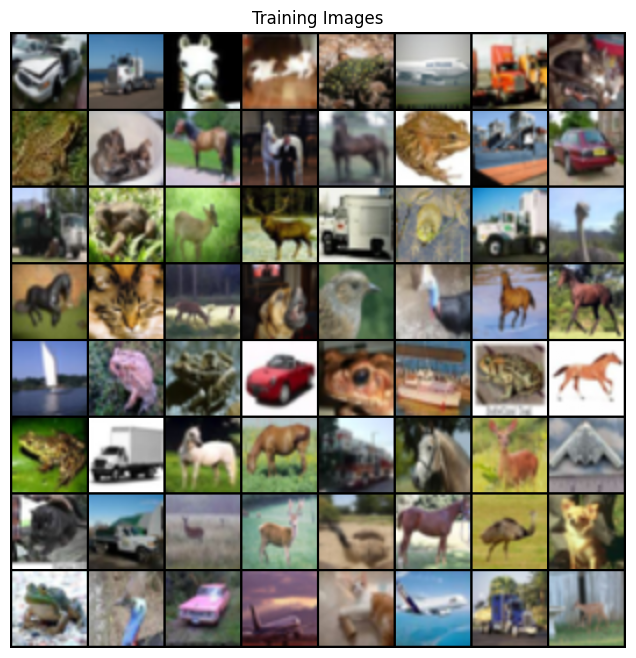

In [4]:
data = next(iter(train_loader))
data[0].shape

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(data[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()


In [5]:

def init_weights(m):
    """Adapted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html. """
    clazz = m.__class__.__name__
    if clazz.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif clazz.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

dc_gen.apply(init_weights)
dc_dis.apply(init_weights)

display(dc_gen)
display(dc_dis)



NetG(
  (embedding): Embedding(10, 100)
  (sequence): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bi

NetD(
  (embedding): Embedding(10, 512)
  (sequence): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (last_conv2d): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (flatten): Fla

In [6]:
def train(g, d, gen_optimizer, dis_optimizer, loss_fn, class_loss_fn, train_loader, epoch):
    derrors, gerrors, gen_imgs, dx, d_g_x1, d_g_x2= [],[], [], [],[], []
    fid = FrechetInceptionDistance(device = device)
    for idx, data in enumerate(train_loader):    
        g.train()
        d.train()
        
        fid.update((data[0]-data[0].min())/(data[0].max()-data[0].min()), is_real=True)
        d.zero_grad()
        imgs = data[0].to(device)
        batch_size = imgs.size(0)
        label = torch.full((batch_size,), .9, dtype=torch.float, device=device)
        # Real images with discriminator
        output, class_guess = d(imgs, data[1].to(device))
        d_real_error = loss_fn(output.squeeze(), label)
        d_real_error += class_loss_fn(class_guess, data[1].to(device))
        d_real_error.backward()      
        dx.append(output.mean().item())

        # Fake images with discriminator
        zvector = torch.randn((batch_size, 100, 1, 1), device=device)
        fakes = g(zvector, data[1].to(device))
        output, class_guess = d(fakes.detach(), data[1].to(device))
        bad_label = torch.full((batch_size,), 0, dtype=torch.float, device=device)
        d_fake_error = loss_fn(output.squeeze(),bad_label)
        d_fake_error += class_loss_fn(class_guess, data[1].to(device))
        d_fake_error.backward()
        d_g_x1.append(output.mean().item())
        
        #(d_real_error + d_fake_error).backward()

        dis_optimizer.step()
        total_Derror = d_fake_error + d_real_error
        #total_Derror.backward()
        derrors.append(total_Derror.item())
        

        # Do the loss of G
        g.zero_grad()
        trick_label = torch.full((batch_size,), .9, dtype=torch.float, device=device)
        #fakes = g(zvector)
        output, class_guess = d(fakes, data[1].to(device))
        g_error = loss_fn(output.squeeze(), trick_label)
        g_error += class_loss_fn(class_guess, data[1].to(device))
        gerrors.append(g_error.item())
        #print(g_error)
        g_error.backward()
        gen_optimizer.step()
        d_g_x2.append(output.mean().item())

        if idx == (len(train_loader) -1) and (epoch+1) % 5 == 0:
            with torch.no_grad():
                g.eval()
                #torch.randint(0,10, (64,1)).to(device).detach().cpu()
                extra_fake = g(fixed_noise, fixed_labels) #data[1].to(device)).detach().cpu()
                gen_imgs.append(vutils.make_grid(extra_fake, padding=2, normalize=True))
                
                fig = plt.figure(figsize=(8,8))
                plt.axis("off")
                plt.imshow(np.transpose(vutils.make_grid(fakes, padding=2, normalize=True).cpu(), (2,1,0)))
                plt.show()
                plt.close(fig)
                
        if idx == (len(train_loader) -1):
            fid.update((fakes-fakes.min())/(fakes.max()-fakes.min()), is_real=False)
        
    return derrors, gerrors, gen_imgs, fid.compute().item()

epoch: 0, D_Loss: 0.3299644544834981, G_Loss: 5.538895539005699, FID: 306.3196716308594
epoch: 1, D_Loss: 0.3541654903070091, G_Loss: 3.104397416724573, FID: 256.8910827636719
epoch: 2, D_Loss: 0.27071254307885306, G_Loss: 2.8857626148197046, FID: 173.64178466796875
epoch: 3, D_Loss: 0.22872019759224504, G_Loss: 2.7941131621522977, FID: 125.80433654785156


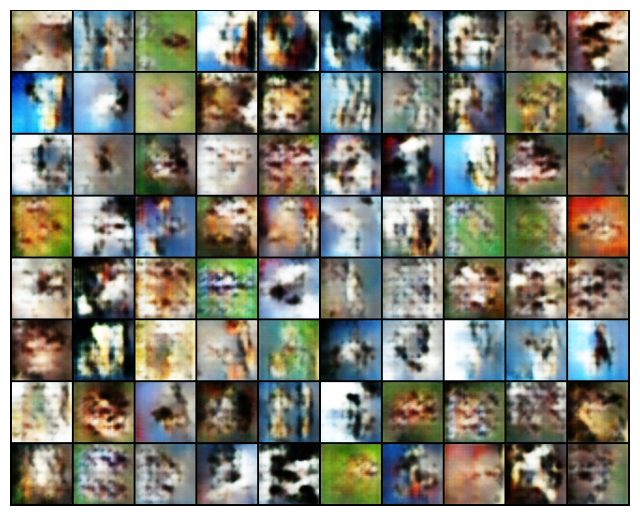

epoch: 4, D_Loss: 0.2621631837066482, G_Loss: 2.422552227516613, FID: 108.44002532958984
epoch: 5, D_Loss: 0.26144733855410307, G_Loss: 2.3230720663162145, FID: 98.22236633300781
epoch: 6, D_Loss: 0.23558711277706848, G_Loss: 2.406933056690809, FID: 109.84874725341797
epoch: 7, D_Loss: 0.09921972396428627, G_Loss: 2.680463284520847, FID: 87.34844207763672
epoch: 8, D_Loss: 0.0760129401579385, G_Loss: 2.8024649286209167, FID: 87.78240966796875


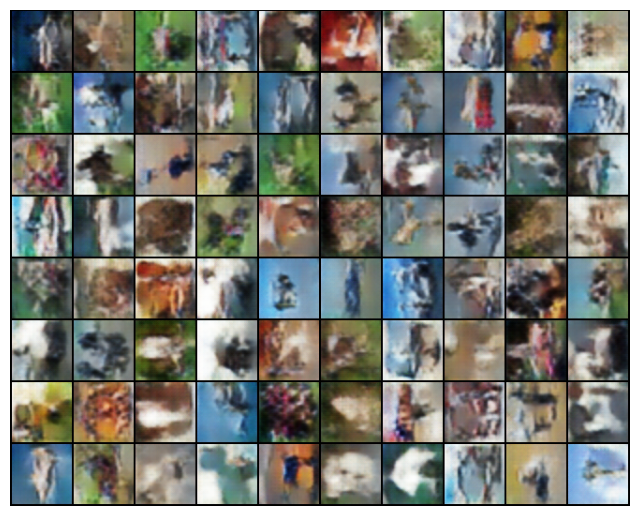

epoch: 9, D_Loss: -0.05172753402644106, G_Loss: 3.1353124662890766, FID: 84.55017852783203
epoch: 10, D_Loss: -0.04632971065161783, G_Loss: 2.963647804601723, FID: 85.0758056640625
epoch: 11, D_Loss: -0.05242759717242492, G_Loss: 3.0772846982530924, FID: 79.104248046875
epoch: 12, D_Loss: -0.040929858032089976, G_Loss: 2.769765872822698, FID: 79.57597351074219
epoch: 13, D_Loss: -0.06210975248909667, G_Loss: 3.0119961785233538, FID: 77.86141967773438


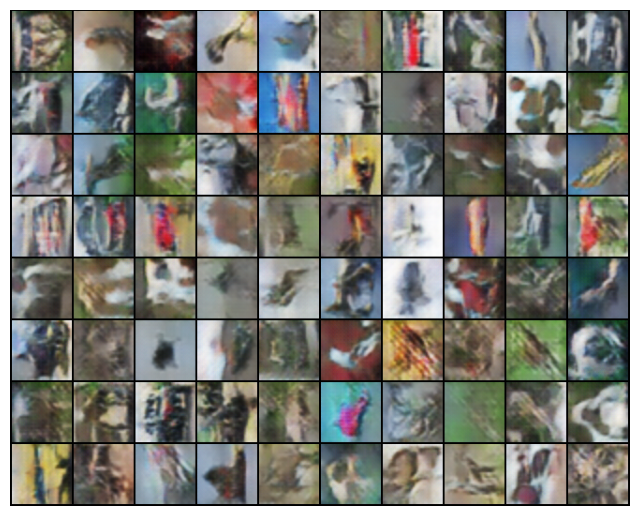

epoch: 14, D_Loss: -0.025828552653874886, G_Loss: 2.7694772666372605, FID: 79.68963623046875
epoch: 15, D_Loss: -0.08014025903113968, G_Loss: 2.8360927862965544, FID: 78.51359558105469
epoch: 16, D_Loss: -0.08614707942051655, G_Loss: 2.839701352750554, FID: 77.82962036132812
epoch: 17, D_Loss: -0.15465214036767136, G_Loss: 2.9552935327562833, FID: 78.52651977539062
epoch: 18, D_Loss: -0.14982778226475582, G_Loss: 3.1692312632680246, FID: 77.05633544921875


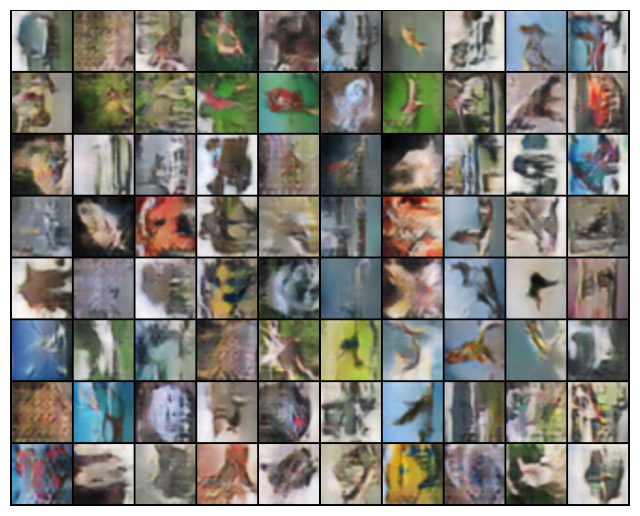

epoch: 19, D_Loss: -0.09309836236945808, G_Loss: 2.656497275280526, FID: 76.04566955566406
epoch: 20, D_Loss: -0.20005870557121, G_Loss: 2.9621389323030898, FID: 76.23187255859375
epoch: 21, D_Loss: -0.1360971690977321, G_Loss: 3.0162877396244525, FID: 78.94412231445312
epoch: 22, D_Loss: -0.20408745329169667, G_Loss: 2.924759735079373, FID: 74.85922241210938
epoch: 23, D_Loss: -0.18723109667487156, G_Loss: 2.894056924163838, FID: 71.03836059570312


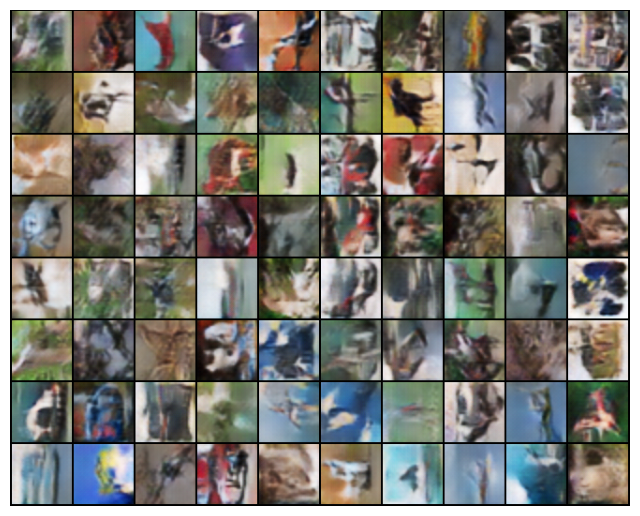

epoch: 24, D_Loss: -0.26466880510072877, G_Loss: 3.215947677564743, FID: 75.90957641601562
epoch: 25, D_Loss: -0.31745304643650496, G_Loss: 3.2407146617579645, FID: 86.1739501953125
epoch: 26, D_Loss: -0.24797928745827408, G_Loss: 3.0478714986530413, FID: 72.78190612792969
epoch: 27, D_Loss: -0.27809830464403645, G_Loss: 3.0519969714114734, FID: 74.30192565917969
epoch: 28, D_Loss: -0.36415791136148334, G_Loss: 3.239336468984404, FID: 72.19696044921875


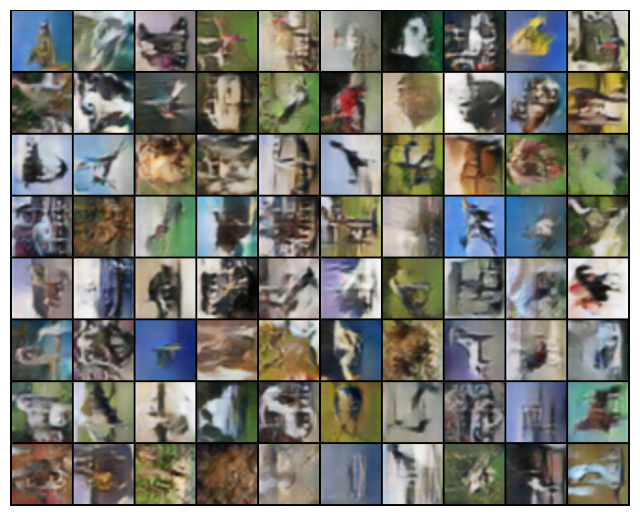

epoch: 29, D_Loss: -0.2823880771008294, G_Loss: 3.1101013296248055, FID: 73.74969482421875
epoch: 30, D_Loss: -0.2821241312510217, G_Loss: 3.192316902034423, FID: 72.1002197265625
epoch: 31, D_Loss: -0.3536370539432749, G_Loss: 3.300353622192617, FID: 70.87367248535156
epoch: 32, D_Loss: -0.34410980498165733, G_Loss: 3.1743453535658626, FID: 73.34278869628906
epoch: 33, D_Loss: -0.27066879629936363, G_Loss: 3.0704485549188942, FID: 73.50465393066406


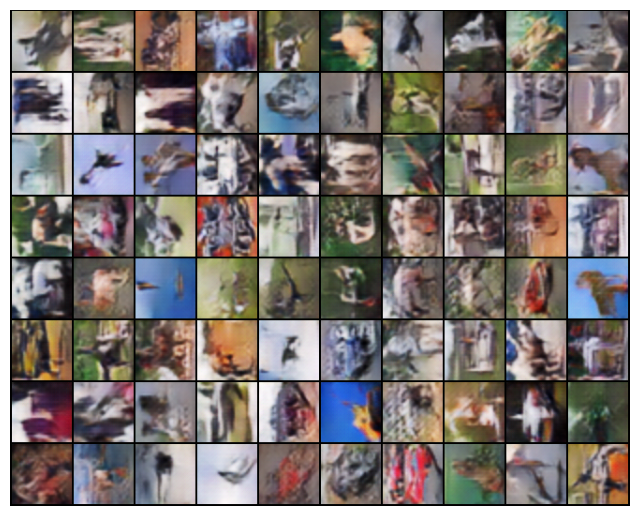

epoch: 34, D_Loss: -0.4406175566527545, G_Loss: 3.3944025780538767, FID: 73.14828491210938
epoch: 35, D_Loss: -0.3693449813729662, G_Loss: 3.3371528047506156, FID: 74.93899536132812
epoch: 36, D_Loss: -0.3822368981169008, G_Loss: 3.206034985344733, FID: 70.61572265625
epoch: 37, D_Loss: -0.3610190254114473, G_Loss: 3.3599927321724268, FID: 73.26409912109375
epoch: 38, D_Loss: -0.3554538710095236, G_Loss: 3.0984272542969347, FID: 71.97236633300781


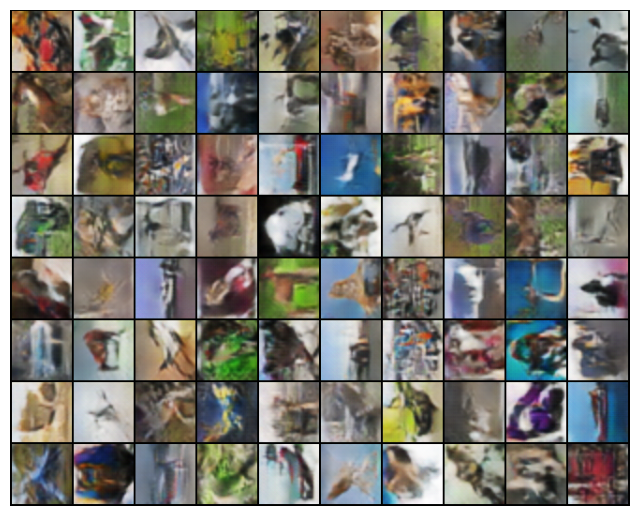

epoch: 39, D_Loss: -0.4269526722219289, G_Loss: 3.3340903386435548, FID: 72.06454467773438
epoch: 40, D_Loss: -0.43222298762758676, G_Loss: 3.4772657672005236, FID: 70.74913024902344
epoch: 41, D_Loss: -0.3839898118391976, G_Loss: 3.2179436615437194, FID: 71.38938903808594
epoch: 42, D_Loss: -0.4309441772339594, G_Loss: 3.314347576302336, FID: 73.214599609375
epoch: 43, D_Loss: -0.4416862890753142, G_Loss: 3.4680136388067697, FID: 74.30923461914062


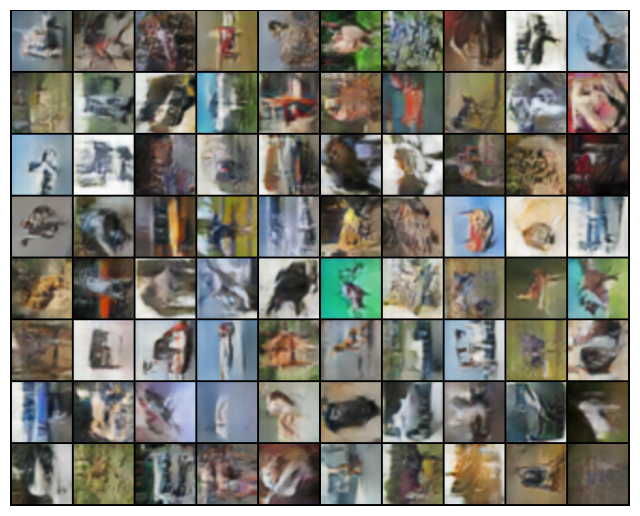

epoch: 44, D_Loss: -0.4554271651789203, G_Loss: 3.434518735427076, FID: 71.73300170898438
epoch: 45, D_Loss: -0.4293437656539176, G_Loss: 3.291188191117533, FID: 71.892578125
epoch: 46, D_Loss: -0.4073628245107353, G_Loss: 3.2213657809340437, FID: 71.76448059082031
epoch: 47, D_Loss: -0.4793174574937662, G_Loss: 3.469136537950667, FID: 71.52052307128906
epoch: 48, D_Loss: -0.4679022332286591, G_Loss: 3.4003815847589536, FID: 73.00950622558594


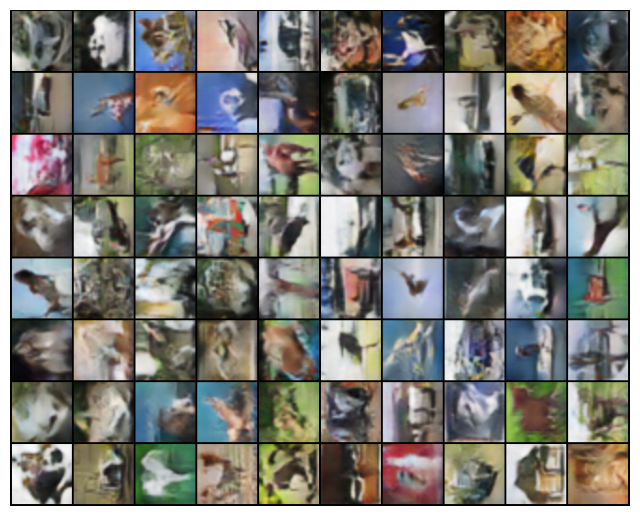

epoch: 49, D_Loss: -0.4422099038367838, G_Loss: 3.3661791424617133, FID: 71.20765686035156


In [7]:
# Training Loop
alld, allg, all_imgs, fids = [],[],[], []
for epoch in range(epochs):
    d_real_error, g_error, gen_imgs, fid = train(dc_gen, dc_dis, gen_optimizer, dis_optimizer, loss_fn,class_loss_fn, train_loader, epoch)
    print(f'epoch: {epoch}, D_Loss: {sum(d_real_error)/len(d_real_error)}, G_Loss: {sum(g_error)/len(g_error)}, FID: {fid}')
    alld.extend(d_real_error)
    allg.extend(g_error)
    all_imgs.extend(gen_imgs)
    fids.append(fid)


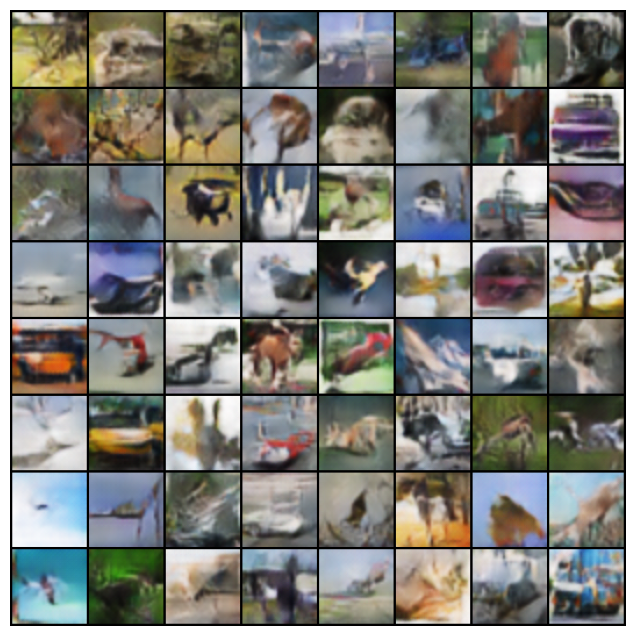

In [8]:
mpl.rcParams['animation.embed_limit'] = 2**128
fig = plt.figure(figsize=(8,8))
plt.axis("off")
image = [[plt.imshow(np.transpose(i.cpu()[:3], (1,2,0)), animated=True)] for i in all_imgs]
#image = [[plt.imshow(i.cpu(), animated=True)] for i in all_imgs]
ani = animation.ArtistAnimation(fig, image, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [9]:
len(allg)

19550

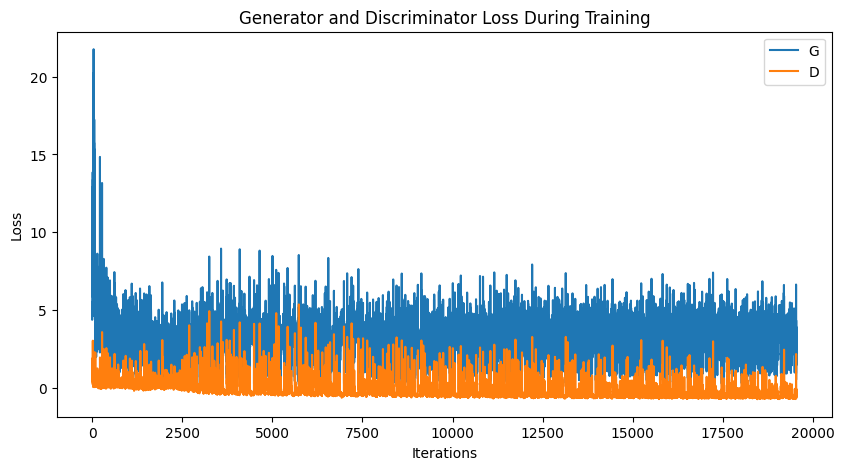

In [10]:
# alliters = list(range(alld))

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(allg,label="G")
plt.plot(alld,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [11]:
torch.save(dc_gen.state_dict(),'g_acgan.pth')
torch.save(dc_dis.state_dict(), 'd_acgan.pth')

# dc_gen, dc_dis

torch.Size([1, 100, 1, 1])

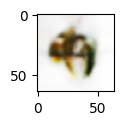

In [12]:
dc_gen.eval()
rando_noise = torch.randn(1,100,1,1)
img = dc_gen(rando_noise.to(device), data[1][0].to(device))
fig = plt.figure(figsize=(1,1))
plt.imshow(np.transpose(vutils.make_grid(img, padding=2, normalize=True).cpu(), (2,1,0)))
#img.cpu().detach()
#np.transpose(img.detach().cpu(), (1,2,0))
#fixed_noise[0,:].unsqueeze(0).shape
torch.full((1,100,1,1), .75 ).shape

In [13]:
gen_imgs[0].shape

torch.Size([3, 530, 530])

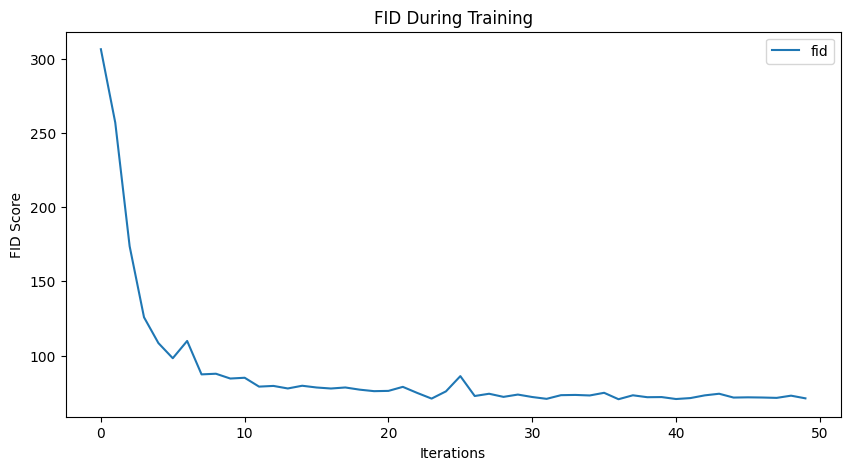

In [14]:
# alliters = list(range(alld))

plt.figure(figsize=(10,5))
plt.title("FID During Training")
plt.plot(fids, label='fid')
plt.xlabel("Iterations")
plt.ylabel("FID Score")
plt.legend()
plt.show()

In [15]:
fids

[306.3196716308594,
 256.8910827636719,
 173.64178466796875,
 125.80433654785156,
 108.44002532958984,
 98.22236633300781,
 109.84874725341797,
 87.34844207763672,
 87.78240966796875,
 84.55017852783203,
 85.0758056640625,
 79.104248046875,
 79.57597351074219,
 77.86141967773438,
 79.68963623046875,
 78.51359558105469,
 77.82962036132812,
 78.52651977539062,
 77.05633544921875,
 76.04566955566406,
 76.23187255859375,
 78.94412231445312,
 74.85922241210938,
 71.03836059570312,
 75.90957641601562,
 86.1739501953125,
 72.78190612792969,
 74.30192565917969,
 72.19696044921875,
 73.74969482421875,
 72.1002197265625,
 70.87367248535156,
 73.34278869628906,
 73.50465393066406,
 73.14828491210938,
 74.93899536132812,
 70.61572265625,
 73.26409912109375,
 71.97236633300781,
 72.06454467773438,
 70.74913024902344,
 71.38938903808594,
 73.214599609375,
 74.30923461914062,
 71.73300170898438,
 71.892578125,
 71.76448059082031,
 71.52052307128906,
 73.00950622558594,
 71.20765686035156]

In [16]:
%reset -f 